## Проектная работа. Рынок заведений общественного питания Москвы

### Описание проекта

  Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
    
  Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
   
  Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
  
  Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

#### Описание данных

Файл `moscow_places.csv`:
 - name — название заведения;
 - address — адрес заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - hours — информация о днях и часах работы;
 - lat — широта географической точки, в которой находится заведение;
 - lng — долгота географической точки, в которой находится заведение;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;
 - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        
        0 — заведение не является сетевым
        1 — заведение является сетевым
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 - seats — количество посадочных мест.

### Шаг 1. Загрузим данные и изучим общую информацию о датасэте.

Импорт необходимых библиотек.

In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import scipy.stats as st
import matplotlib.pyplot as plt
import math as mth
import folium
import json # подключаем модуль для работы с JSON-форматом
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# импортируем собственные иконки
from folium.features import CustomIcon
from datetime import datetime as dt, timedelta
from folium import Map, Choropleth # импортируем карту и хороплет
from pandas.plotting import register_matplotlib_converters
from plotly import graph_objects as go
import plotly.express as px
import warnings
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', 120)
pd.set_option('display.width', 500)

Загрузим данные о заведениях общественного питания Москвы.
    
    Путь к файлу: /datasets/moscow_places.csv. 

Изучим общую информацию о датасете. Ответим на вопросы: Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

#### Загрузка данных.

In [3]:
df = pd.read_csv('/datasets/moscow_places.csv', sep=',') # читаем csv-файл

#### Изучим общую информацию о наборе данных.

In [4]:
# выведем первые строки датафрэйма
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
# получение общей информации о данных из датафрейма data
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Описание датафрэйма:** 
    
    - В таблице 13 столбцов;
    - Столбцы имеют корректные названия;
    - Данные содержат информацию о 8406 заведениях питания Москвы;
    - Первые пять столбцов содержат информацию о заведении: наименование, категория, адрес, район города, где расположенна организация, режим работы. Данные в тестовом формате.
    - Следующие 2 столбца: координаты заведения на карте Москвы;
    - Последние 7 столбцов - это данные о самом заведении: рэйтинг, информация о ценах, средний счет, средняя стоимость чашки кофе, сетевое кафе или нет, количество мест в заведении.

#### Построим гистограммы по всем столбцам датафрэйма.

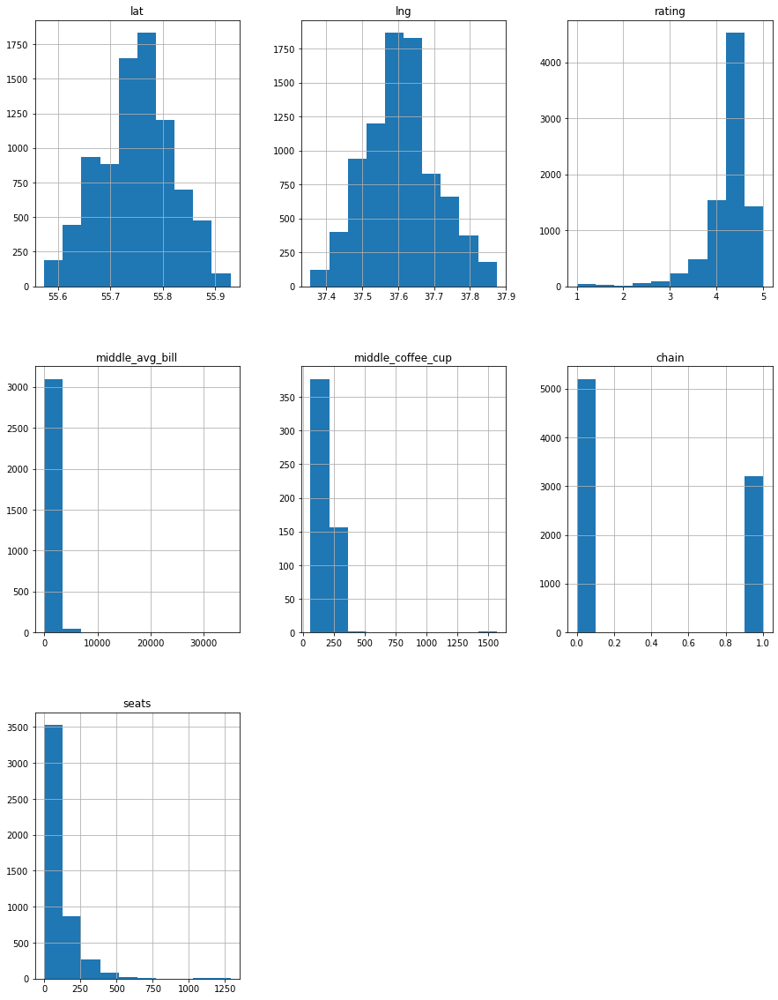

In [6]:
df.hist(figsize=(15, 20)) # Построим гистограммы по всем столбцам датафрэйма на одном графике.
plt.show()

  По первым графикам видно, что в столбцах `lat`, `lng` и`rating` распределение близкое к нормальному.

  В столбцах `middle_avg_bil`, `middle_cofe_bil` и `seats` распределение Пуассона, которое описывает средний чек, средний чек за чашку кофе и количество мест в заведении. Основные данные сконцентрированны около нуля, с длинных хвостом. Похоже в данных о количестве посадочных мест имеются выбросы - небольшой пик с количеством мест более 1000. Более подробно рассмотрим эти данные дальше.

  Столбец `chain`содержит категориальные данные. Более подробно данные изучим в следующих частях исследования.

### Шаг 2. Выполним предобработку данных.

#### Проверка дубликатов.

Изучим, есть ли дубликаты в данных. Поищим пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [7]:
# проверим датафрэйм на наличие явных дубликатов
df.duplicated().sum() 

0

В данных нет явных дубликатов.

 Поищем неявные дубликаты по столбцам с названием, адресом и категорией заведения. Приведем значения в строках к нижнему регистру.

In [8]:
# Привести содержимое категориальных колонок к нижнему регистру
df['name'] = df['name'].str.lower()
df['category'] = df['category'].str.lower()
df['address'] = df['address'].str.lower()

# Показать исходный DataFrame после обработки
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Обработка сработала корректно.

In [9]:
# Найти неявные дубликаты по ключевым столбцам ['category', 'lat', 'lng']
duplicates = df[df.duplicated(subset=['name','category', 'address','lat','lng'], keep='first')]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Найдена одна строка с дубликатом. Удалим дубликаты из датафрэйма.

In [10]:
# Удаление дубликатов из DataFrame по ключевым столбцам
df = df.drop_duplicates(subset=['name','category', 'address','lat','lng'], keep='first')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8405 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              7869 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8405 non-null   int64  
 13  seats              4794 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 985.0+ KB


#### Проверка пропусков.

In [11]:
# Проверка на наличие пропусков в столбцах
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5090
avg_bill             4589
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

    Так как данные в первой части таблицы (первые 7 столбцов) получены из сервиса Яндекс карты, то в данных практически нет пропусков. Только в столбце с режимом работы заведения. Но это объяснимо, не все организации указывают свой режим работы. Оставим эти пропуски без изменений.

    Так как информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. И в этих данных больше всего пропусков (8-13 столбцы датафрэйма). Оставим пропуски как есть.

In [12]:
# check
# пропущенные значения бары

def pass_value_barh(dfg):
    try:
        (
            (dfg.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = -5, legend = False, fontsize = 16)
            .set_title('Пример' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

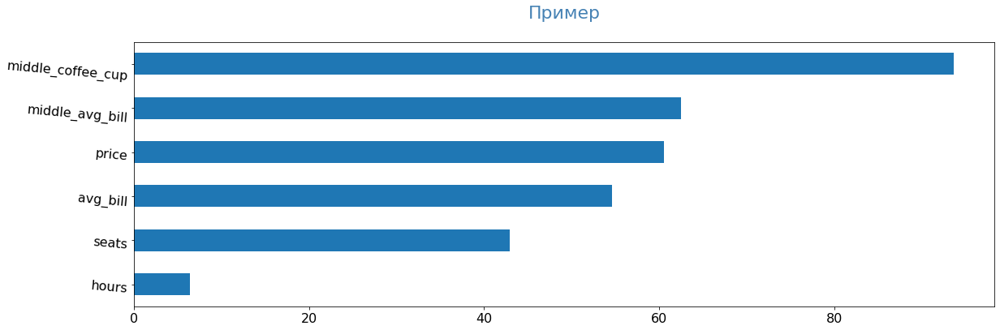

In [13]:
pass_value_barh(df)

<div style="border:solid steelblue 3px; padding: 20px">
<font size="4">🍕<b> Комментарий ревьюера</b></font>
<br /> 
<font size="3", color = "black">
<br /> Наглядность представления информации одна из важных составляющих работы дата-аналитика или дата-сайентиста
    
__мой график оформлен не совсем корректно, сможешь отметить, что стоило бы исправить в графике?__
  

#### Столбец `seats` данные о количестве посадочных мест.

Построим гистограмму и  описательную статистику по столбцу 'seats'. Проанализируем полученные данные.

In [14]:
df['seats'].describe() # смотрим описательную статистику

count    4794.000000
mean      108.405090
std       122.840831
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Среднее равно 108 мест, довольно крупные заведения. Проверим, возможно сренее искажают аномально высокие значения?

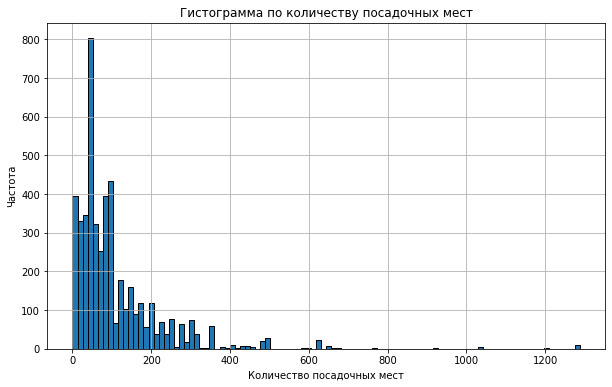

In [15]:
# Построение гистограммы по столбцу 'seats'
plt.figure(figsize=(10, 6))
df['seats'].dropna().hist(bins=100, edgecolor='black')
plt.title('Гистограмма по количеству посадочных мест')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Частота')
plt.show()

В основном в заведениях до 400 посадочных мест, с пиком около 30 мест - адекватная цифра для стандартного кафе, ресторана. При этом есть организации с количеством мест более 1000. Рассмотрим их подробней.

In [16]:
df['seats'].sort_values(ascending=False).head(15)

6518    1288.0
6641    1288.0
6658    1288.0
6807    1288.0
6808    1288.0
6684    1288.0
6690    1288.0
6524    1288.0
6574    1288.0
6771    1288.0
6838    1288.0
4231    1200.0
2722    1040.0
2966    1040.0
2770    1040.0
Name: seats, dtype: float64

Более 15 заведений с местами от 1000, посмотрим, что это за организации. И странная максимальная цифра 1288, похоже на аномалию. Проверим, к какой категории относятся эти организации. 

In [17]:
seats = df['seats'].dropna()
np.percentile(seats, [90, 95, 99])

array([240., 307., 625.])

In [18]:
# Отфильтруем заведения с числом мест более 625
df[df['seats']>625].sort_values(by='seats', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6838,alternative coffee,кофейня,"москва, проспект вернадского, 41, стр. 1",Западный административный округ,"пн-пт 09:00–21:00; сб,вс 09:00–22:00",55.673128,37.502992,4.3,NaN,NaN,NaN,NaN,0,1288.0
6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0
6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0


In [19]:
df.query('seats>625')['seats'].sort_values(ascending=False).count()

30

  **Вывод:**
  Что можно сказать по полученным данным:
  
  - В 99% случаев количество мест не превышает 625 шт.
  - Заведений с большим количеством мест всего 30. И они довольно странные. 11 организаций, находятся на одной улице - проспект Вернадского, но номера домов разные. Попалось даже две кофейни с числом мест - 1288. Это явно аномалия. Удалим в этих строках информацию о количестве мест, сами заведения оставим, так как информация о них получена с более достоверного источника - Яндекс карты.
  - Следующая интересная цифра - 1040 и интересный адрес Измайловское шоссе, 71, корпуса разные. По этому адресу находятся гостиничные комплексы. Заведения встречаются разные: кафе, столовая, кофейня. И по всем одинаковые количества мест: 1040 и 660 соответственно. Возможно это открытые пространства с общими столами для разных точек общепита. Оставим без изменений.
  - Остальные крупные точки с одним адресом и общим количеством мест, думаю аналогичны предыдущей ситуации: общие столы, для разных заведений.
 
Итог. Удаляем только количсетво мест равное 1288, остальные большие значения оставляем без изменений. 

In [20]:
# Проверка
max_seats = df[df['seats']>1000].sort_values(by='seats', ascending=False)

# Замена значения 1288 на пропуски
df['seats'].replace(1288, np.nan, inplace=True)

max_seats

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0
6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0
6690,японская кухня,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0
6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0
6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0
6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0


Замена прошла корректно.

#### Создадим столбец `street` с названиями улиц из столбца с адресом.

Попробуем извлечь название улицы из адреса. Улицей будет всё, что идёт после слова Москва и разделителя в виде запятой, начинается либо с цифр либо с букв и продолжается до следующего разделителя в виде запятой. Также нужно учесть, что следующего разделителя может и не быть и названием улицы адрес может заканчиваться.

In [21]:
def extract_street(address):
    # Ищем улицу в строке адреса
    match = re.search(r'москва,\s*(.*?)(?:,|\s\d|$)', address)
    return match.group(1).strip() if match else ''
# Удаляем лишние пробелы, если они есть
df['address'] = df['address'].str.strip()

# Добавляем столбец с названиями улиц
df['street'] = df['address'].apply(extract_street)

# Проверим работу функции
print(df[["address", "street"]].head())

                               address                   street
0           москва, улица дыбенко, 7/1            улица дыбенко
1   москва, улица дыбенко, 36, корп. 1            улица дыбенко
2       москва, клязьминская улица, 15       клязьминская улица
3  москва, улица маршала федоренко, 12  улица маршала федоренко
4      москва, правобережная улица, 1б      правобережная улица


In [22]:
# Подсчет количества пропуска в столбце 'street'
num_missing_streets = df['street'].isna().sum()
print(f'Количество пропусков в столбце street: {num_missing_streets}')

Количество пропусков в столбце street: 0


Функция работает корректно. Все названия улиц, проспектов, переулков и так далее выведены в отдельный столбец `street`. 

#### Создадим столбец `is_24_7`

Создайте столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
     
     логическое значение `True` — если заведение работает ежедневно и круглосуточно;
     логическое значение `False` — в противоположном случае.
     
Напишем функцию для определения, работает ли заведение круглосуточно:

In [23]:
# Функция для определения, работает ли заведение круглосуточно
def is_24_7(hours):
    if pd.isna(hours):
        return False
    hours = str(hours)
    return 'ежедневно' in hours and 'круглосуточно' in hours

# Создание нового столбца is_24_7
df['is_24_7'] = df['hours'].apply(is_24_7)

# Фильтрация DataFrame по столбцу is_24_7 с значением True
df_filtered = df[df['is_24_7'] == True]

df_filtered.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,great room bar,"бар,паб","москва, левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,левобережная улица,True
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,ижорский проезд,True


Функция работает корректно. Все заведения работающие круглосуточно выведены в отдельный столбец `is_24_7`.

#### Создадим дополнительный столбик с сокращенным названием административных округов `'abr_distr'`.

In [24]:
# Создаем словарь для сокращений
abbreviations = {
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ': 'СВОАО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Центральный административный округ': 'ЦАО',
    'Восточный административный округ': 'ВОАО',
    'Юго-Восточный административный округ': 'ЮВОАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Западный административный округ': 'ЮЗАО'
}

# Создаем новую колонку с сокращенными названиями
df['abr_distr'] = df['district'].map(abbreviations)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,abr_distr
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False,САО
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False,САО
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False,САО
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False,САО
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False,САО


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8405 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              7869 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8405 non-null   int64  
 13  seats              4783 non-null   float64
 14  street             8405 non-null   object 
 15  is_24_7            8405 non-null   bool   
 16  abr_distr          8405 

### Шаг 3. Анализ данных.

#### Категории заведений.

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [26]:
# выведем уникальные наименования категорий в столбце `category`
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

В данных встречаются следующие категории заведений общественного питания:
 
 - 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая'.

In [27]:
# Подсчет количества объектов по категориям
category_counts = df['category'].value_counts()
category_counts, category_counts.sum()

(кафе               2378
 ресторан           2042
 кофейня            1413
 бар,паб             765
 пиццерия            633
 быстрое питание     603
 столовая            315
 булочная            256
 Name: category, dtype: int64,
 8405)

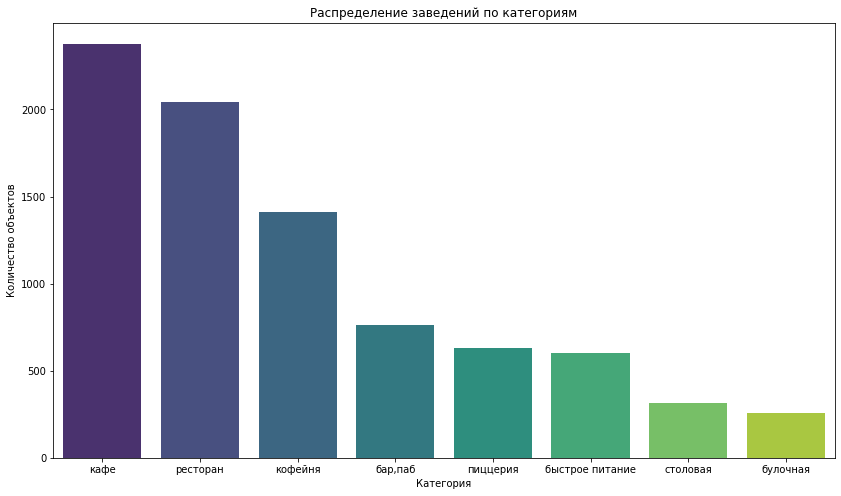

In [28]:
# Построение визуализации
plt.figure(figsize=(14, 8))
sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество объектов')
plt.show()

Вывод: на графике видно, что чаще всего встречаются `кафе` - более 2,4 тыс. заведений.
    - на втором месте `ресторан` - около 2 тыс. 
    - третье место у `кофейни` - примерно 1,4 тыс. 
    - следующие три места разделили между собой: `бар,паб`, `пиццерия` и `быстрое питание` от 765 до 603 заведений.
    - последние два места `столовая` и `булочная` 315 и 256 мест.

#### Исследуем количество посадочных мест.

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

По-скольку речь идет о посадочных местах, значит надо исключить точки где посадочные места отсутствуют. Создадим новую таблицу category_seats и исключим все пропуски.

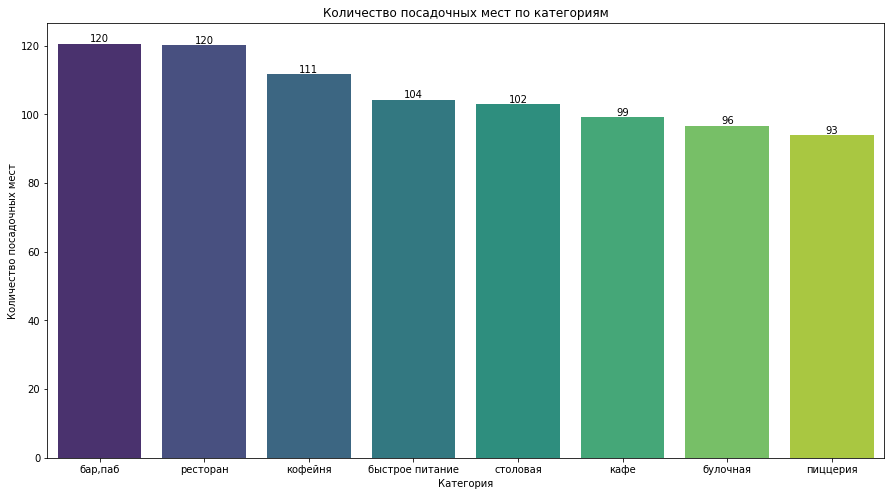

In [29]:
# Исключаем пропуски
df_seats = df[df['seats']!=0].dropna(subset=['seats'])

# Подсчет количества посадочных мест по категориям
category_seats = df_seats.groupby('category')['seats'].mean().sort_values(ascending=False)
   
# Построение визуализации
plt.figure(figsize=(15, 8))
sns.barplot(x=category_seats.index, y=category_seats.values, palette='viridis') 

# Добавление числовых подписей
for index, value in enumerate(category_seats.values):
    plt.text(index, value, f'{int(value)}', ha='center', va='bottom')
    
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

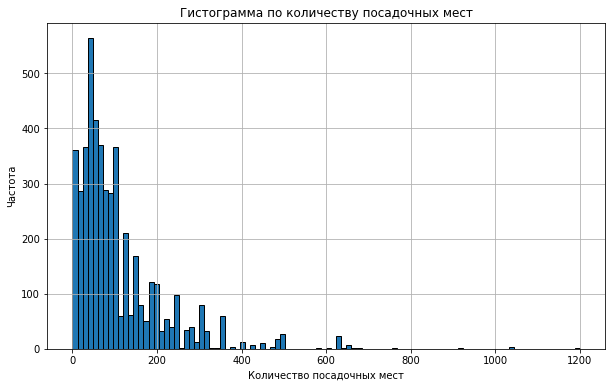

In [30]:
# Построение гистограммы по столбцу 'seats'
plt.figure(figsize=(10, 6))
df['seats'].dropna().hist(bins=100, edgecolor='black')
plt.title('Гистограмма по количеству посадочных мест')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Частота')
plt.show()

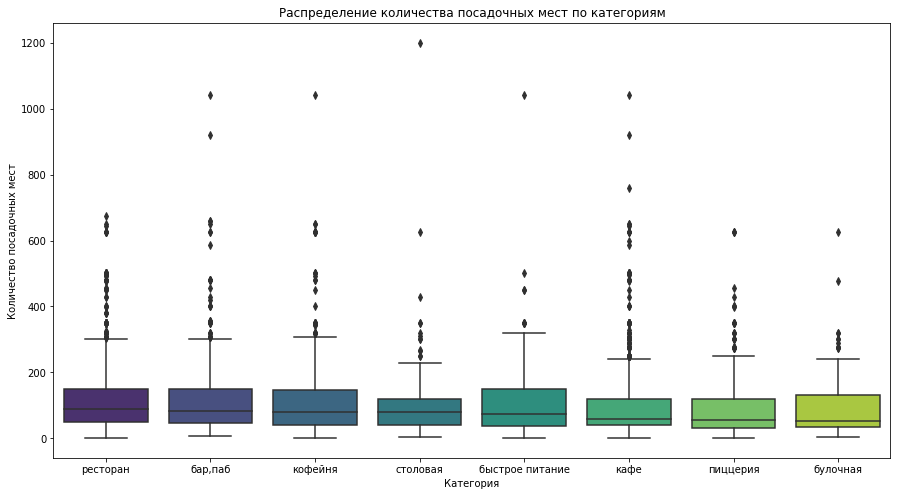

In [31]:
# Вычисление медианы seats для каждой категории и сортировка по убыванию
med_values = df_seats.groupby('category')['seats'].median().sort_values(ascending=False)
ordered_categories = med_values.index

# Построение ящиков с усами
plt.figure(figsize=(15, 8))
sns.boxplot(x='category', y='seats', data=df_seats, order=ordered_categories, palette='viridis')


plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

На графиках более четко видны выбросы. Практически по всем категориям есть заведения с количеством мест более 600. Возможно это открытые пространства или банкетные залы для большого количества гостей. 

Ограничим следующий график до 350 мест. Более наглядно отобразим распределение между квартилями.

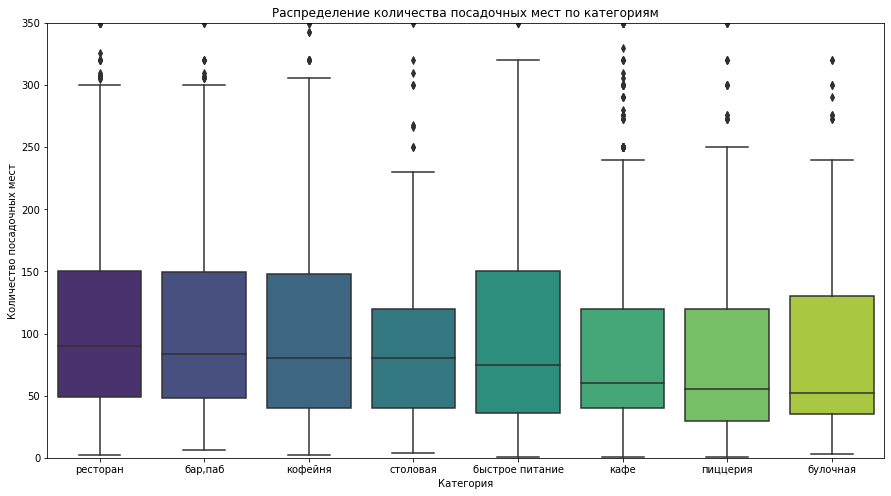

In [32]:
# Построение ящиков с усами с ограничениями
plt.figure(figsize=(15, 8))
sns.boxplot(x='category', y='seats', data=df_seats, order=ordered_categories, palette='viridis')
plt.ylim(0,350)

plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

In [33]:
# описательная статистика по категориям
df_seats_describe = (
    df_seats.groupby("category")["seats"]
    .describe()
    .sort_values(by="mean", ascending=False)
    .reset_index()
)

# Округляем значения в столбце 'mean' до целых
df_seats_describe[["count", "mean", "25%", "75%"]] = (
    df_seats_describe[["count", "mean", "25%", "75%"]].round(0).astype(int)
)

# Выводим только нужные столбцы
df_seats_describe = df_seats_describe[["category", "count", "mean", "25%", "75%"]]
df_seats_describe


,category,count,mean,25%,75%
0,"бар,паб",462,121,48,149
1,ресторан,1245,120,49,150
2,кофейня,725,112,40,148
3,быстрое питание,331,104,36,150
4,столовая,159,103,40,120
5,кафе,1172,99,40,120
6,булочная,137,97,35,130
7,пиццерия,416,94,30,120


**Вывод:**
  На первом месте по количеству мест: `бар/паб` со средним числом около 121, второе место у `ресторан` - 120 мест, на третьем месте кофейни - 112 мест.
  
  Из-за наличия открытых пространсв в крупных торговых центров с ресторанными двориками, количество мест в заведении сильно исказилось. Есть кофейни с количеством мест более 1000.

#### Соотношение сетевых и несетевых заведений.

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше? 
В стобце `chain` пропусков нет, поэтому используем все данные.

Вспомним еще раз какие заведения являются сетевыми, а какие нет: `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

     0 — заведение не является сетевым
     1 — заведение является сетевым

In [34]:
# Посчитаем количество сетевых и несетевых заведений
chain = df.groupby('chain')['name'].count().reset_index()
chain.columns=['chain','count']

# Добавим столбец с долей сетевых и не сетевых заведений к общей сумме
chain['perc'] = round(chain.loc[:, 'count']/chain['count'].sum() ,2)*100

chain

,chain,count,perc
0,0,5201,62.0
1,1,3204,38.0


Несетевых заведений значительно больше. Построим круговую диаграмму, чтобы отобразить это соотношение наглядно.

In [35]:
# задаем категорию заведений
name_chain = ['Несетевые заведения','Сетевые заведения']

# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=name_chain, 
                             values=chain['count'],
                             pull = [0.1, 0],
                             texttemplate='%{percent:.0%}',  # форматируем текст, чтобы убрать десятичные знаки
)]) # добавляем аргумент, который выделит сегмент-лидер на графике)

fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=700, # указываем размеры графика
                  height=500
                  )

fig.show() # выводим график

#### Какие категории заведений чаще являются сетевыми?

Проанализируем, какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.

Подойдёт самая универсальная диаграмма — столбчатая. Для большей наглядности повернём её набок.

Сначала подготовим данные. Найдем общее число заведений каждой категории и посчитаем долю сетевых.

In [36]:
# Посчитаем количество сетевых и несетевых организаций в разрезе категории заведения
category_chain = df.pivot_table('name', aggfunc = 'count', index='category', columns='chain').reset_index()
category_chain.columns = ['category', 'non_chain', 'chain']

# Рассчитываем общее количество заведений для каждой категории
category_chain['total'] = category_chain['non_chain'] + category_chain['chain']

# Рассчитываем процент сетевых заведений
category_chain['chain_perc'] = round((category_chain['chain'] / category_chain['total']) * 100, 1)

category_chain.sort_values(by='chain_perc', ascending=False)

,category,non_chain,chain,total,chain_perc
1,булочная,99,157,256,61.3
5,пиццерия,303,330,633,52.1
4,кофейня,693,720,1413,51.0
2,быстрое питание,371,232,603,38.5
6,ресторан,1313,729,2042,35.7
3,кафе,1599,779,2378,32.8
7,столовая,227,88,315,27.9
0,"бар,паб",596,169,765,22.1


Из таблицы видно, что чаще всего сетевые заведения встречаются среди булочных. Теперь можно строить график:

In [37]:
# строим столбчатую диаграмму 
fig = px.bar(category_chain.sort_values(by='chain_perc', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='chain_perc', # указываем столбец с данными для оси Y
             text='chain_perc' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='% сетевых от общего количества заведений каждого типа',
                   xaxis_title='Доля',
                   yaxis_title='Категория')
fig.show() # выводим график

На графике четко видны лидеры в категории сетевых заведений: это `булочная` (62%), `пицерия`(52%) и `кофейня`(51%). Остальные виды точек представлены здесь в значительно меньших объемах.

#### ТОП-15 популярных сетей в Москве.

Сгруппируем данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. В ходе анализа ответим на вопросы: 
    
    - Знакомы ли вам эти сети? 
    - Есть ли какой-то признак, который их объединяет? 
    - К какой категории заведений они относятся?

In [38]:
# Отфильтруем только сетевые заведения сгруппируем по наименованию и категории 
# и посчитаем количество заведений в каждой сети
top_chain = (
    df[df["chain"] == 1]
    .groupby(['name','category'])["chain"]
    .sum()
    .reset_index()
    .sort_values(by='chain', ascending=False)
    .head(15)
)

# строим столбчатую диаграмму 
fig = px.bar(top_chain.sort_values(by='chain', ascending=True), # загружаем данные и заново их сортируем
             x='chain', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='chain' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 сетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование')
fig.show() # выводим график

Явный лидер и с большим отрывом сеть кофеен - `Шоколадница`. Около 119 точек в регионе. 

Остальные 5 мест,  с количеством точек от 76 до 65, следующие: `Домино'с Пицца`, `Додо Пицца`,
`One Price Coffee`, `Яндекс Лавка`, `Cofix`.

В выборке встречаются довольно популярные заведения. Например `Шоколадница` - сеть кофеин, есть практически во всех крупных торговых центрах. `Домино'с Пицца` и `Додо Пицца` - популярные пицерии.

Посмотрим к каким категориям относятся эти заведения.

In [39]:
# Создание сводной таблицы
category_chain = top_chain.pivot_table(
    index=['category','name'],                 
    values='chain',               
    aggfunc='sum',                # Агрегационная функция - сумма
    fill_value=0                  # Заполнение пропущенных значений нулями
)
category_chain

chain
category name                                      
булочная буханка                                 25
кафе     drive café                              24
         кулинарная лавка братьев караваевых     39
         чайхана                                 26
кофейня  cofefest                                31
         cofix                                   65
         one price coffee                        71
         кофемания                               22
         кофепорт                                42
         шоколадница                            119
пиццерия додо пицца                              74
         домино'с пицца                          76
ресторан prime                                   49
         теремок                                 36
         яндекс лавка                            69

In [40]:
# Отфильтруем только сетевые заведения сгруппируем по наименованию и посчитаем кол-во заведений в каждой сети
dt = (
    top_chain.groupby("category")["chain"]
    .sum()
    .sort_values(ascending=False)
    .reset_index()
)
dt['perc']=round(dt['chain']/dt['chain'].sum()*100,1)
dt

,category,chain,perc
0,кофейня,350,45.6
1,ресторан,154,20.1
2,пиццерия,150,19.5
3,кафе,89,11.6
4,булочная,25,3.3


In [41]:
# строим столбчатую диаграмму 
fig = px.bar(dt.sort_values(by='perc', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='perc', # указываем столбец с данными для оси Y
             text='perc' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='% сетевых точек от общего количества заведений каждого типа',
                   xaxis_title='Категория',
                   yaxis_title='Доля')
fig.show() # выводим график

В топе - кофейни, около 46%, среди общего количества сетевых точек. Второе место поделили рестораны и пиццериии около 20% на каждую категорию. 

In [42]:
# check
x = df.copy()
df_chain = x[x['chain'] == 1] 
 
(
    df_chain
    .groupby(['name', 'category']).agg(count_name=('name', 'count')).sort_values(by='count_name').tail(15)
    .reset_index()
    .groupby('category')['count_name'].sum()
    .to_frame()
    .assign(percent_total=lambda x: x / x.sum()).round(2)
    .sort_values(by='percent_total')
)

,count_name,percent_total
category,,
булочная,25,0.03
кафе,89,0.12
пиццерия,150,0.20
ресторан,154,0.20
кофейня,350,0.46


#### Административные районы Москвы.

Какие административные районы Москвы присутствуют в датасете? 
Отобразите общее количество заведений и количество заведений каждой категории по районам. 
Попробуйте проиллюстрировать эту информацию одним графиком.

In [43]:
# посмотрим какие административные районы Москвы присутствуют в датасете.
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

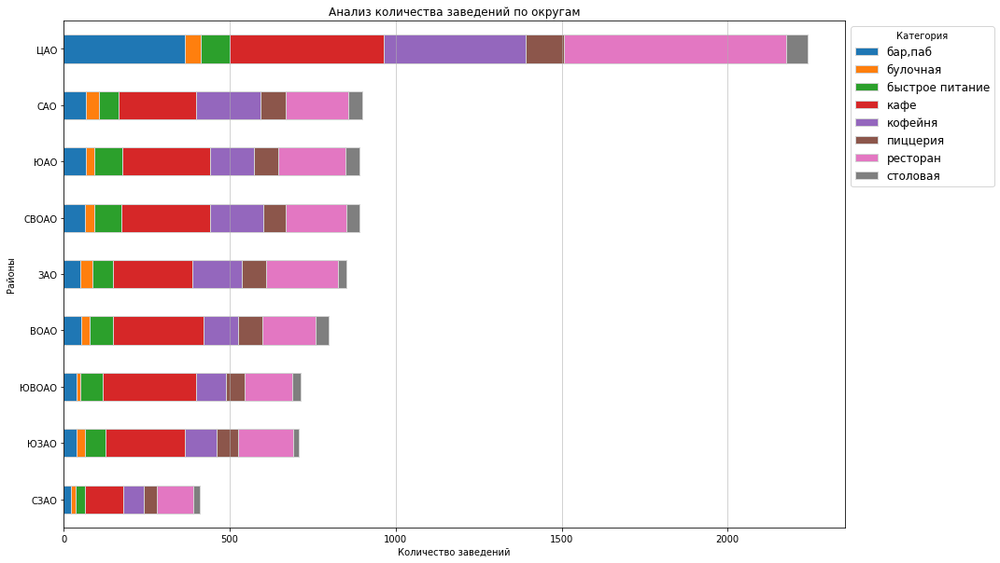

In [44]:
# Сгруппируем данные по районам и категориям
counts_dist = df.groupby(['abr_distr', 'category']).size().unstack()
counts_dist = counts_dist.reindex(sorted(counts_dist.columns), axis=1)
counts_dist['total'] = counts_dist.sum(axis=1)  
counts_dist = counts_dist.sort_values(by='total', ascending=True).drop('total', axis=1)

# Создаем график
fig, ax = plt.subplots(figsize=(15, 10))
counts_dist.plot(kind='barh', stacked=True, edgecolor='lightgrey', ax=ax)

# Настраиваем оси и заголовок
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Районы')
ax.set_title('Анализ количества заведений по округам')
# Размещаем легенду справа
ax.legend(title='Категория', fontsize='large', loc='upper left', bbox_to_anchor=(1, 1))

# Добавляем сетку
ax.grid(axis='x', linestyle='-', alpha=0.7)

# Отображаем график
plt.show()

Больше всего заведений сконцентрированно в Центральном АО, около 2,2 тыс заведений. В остальных административных округам количество организаций не превышает 1 тыс. Меньше всего заведений в Северно-Западном округе и это значение в 1,5-2 раза ниже характерного для всех других районов.
  
  Из-за большого отличия в количестве заведений между ЦАО и остальными округами добавим второй вид графика, в относительных цифрах.

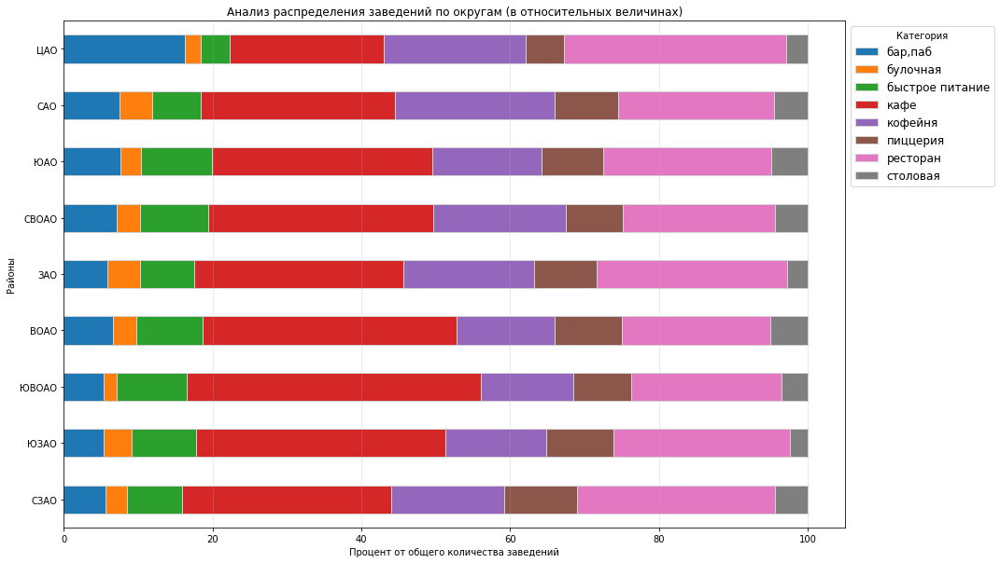

In [45]:
# Для получения относительных значений (в процентах) нужно выполнить следующую последовательность действий:
# 1. Суммируем по всем категориям для каждого района.
# 2. Делим каждую ячейку на соответствующую сумму по району.

# Получаем суммарное количество заведений по районам
totals = counts_dist.sum(axis=1)

# Вычисляем относительные значения
relative_counts = counts_dist.div(totals, axis=0) * 100  # Умножаем на 100 для получения процентов

# Сортируем и убираем итоговые значения
relative_counts = relative_counts.reindex(sorted(relative_counts.columns), axis=1)

# Создаем график
fig, ax = plt.subplots(figsize=(15, 10))
relative_counts.plot(kind='barh', stacked=True, edgecolor='lightgrey', ax=ax)

# Настраиваем оси и заголовок
ax.set_xlabel('Процент от общего количества заведений')
ax.set_ylabel('Районы')
ax.set_title('Анализ распределения заведений по округам (в относительных величинах)')
# Размещаем легенду справа
ax.legend(title='Категория', fontsize='large', loc='upper left', bbox_to_anchor=(1, 1))

# Добавляем сетку
ax.grid(axis='x', linestyle='-', alpha=0.3)

# Отображаем график
plt.show()

На графике видно, что в каждом округе преобладают кафе, рестораны и кофейни. Наименее популярны булочные.

#### Распределение средних рейтингов по категориям заведений.

Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

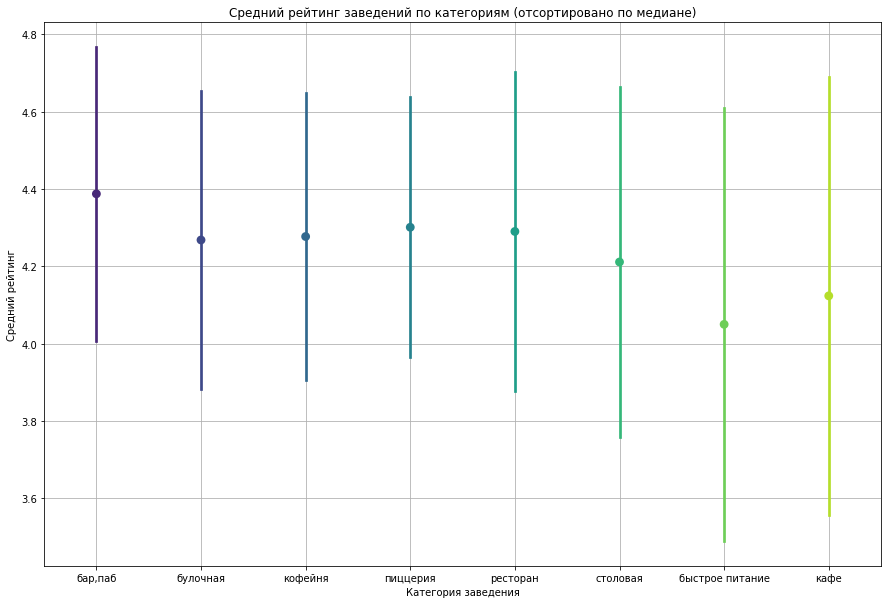

In [46]:
# Рассчитываем медианы для каждой категории
median_ratings = df.groupby('category')['rating'].median().sort_values(ascending=False)

# Получаем отсортированный порядок категорий
sorted_categories = median_ratings.index

# Строим график с использованием отсортированного порядка
plt.figure(figsize=(15, 10))
sns.pointplot(data=df, x='category', y='rating', ci='sd', palette='viridis', order=sorted_categories)
plt.grid(True)
plt.title('Средний рейтинг заведений по категориям (отсортировано по медиане)')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

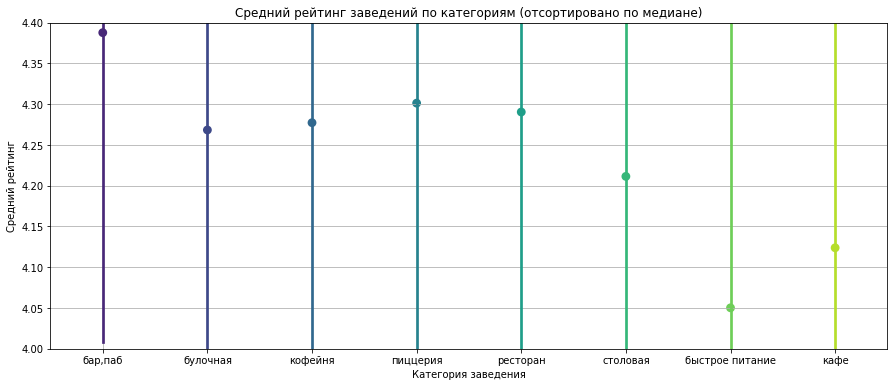

In [47]:
# Строим график с использованием отсортированного порядка
plt.figure(figsize=(15, 6))
sns.pointplot(data=df, x='category', y='rating', ci='sd', palette='viridis', order=sorted_categories)
plt.ylim(4,4.4)
plt.grid(True)
plt.title('Средний рейтинг заведений по категориям (отсортировано по медиане)')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

   - Наивысший средний рейтинг у `бар,паб` около 4,4. Бары/пабы всчтречаются на порядок реже, чем кафе.
   - У заведений: `ресторан`, `кофейня`, `пицерия`, `булочная`, `столовая`  средний рейтинг от 4.2 до 4.3.
   - Самый низкий средний рейтинг и наибольший разброс у заведений: `кафе` и `быстрое питание`. Это и не удивительно. Кафе самая популярная категория заведений, поэтому и разборс оценок здесь довольно высокий. 

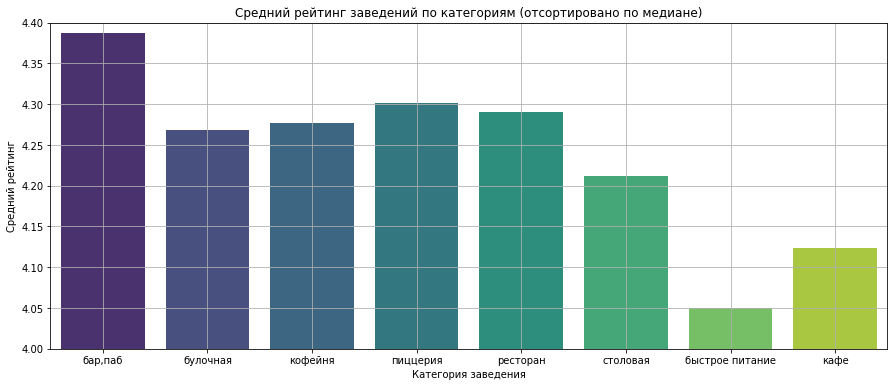

In [48]:
# check
# Строим график с использованием отсортированного порядка
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='category', y='rating', ci=False, palette='viridis', order=sorted_categories)
plt.ylim(4,4.4)
plt.grid(True)
plt.title('Средний рейтинг заведений по категориям (отсортировано по медиане)')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

Для каждого округа посчитаем медианный рейтинг торговых центров, которые находятся на его территории:

In [49]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating',ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239822
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [50]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [51]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)


# Отображение карты
m

Самые высокие оценки - в центре, ниже всего на северо и юго-востоке.

#### Все заведения на карте.

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [52]:
# создаём карту Москвы
m_с = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_с)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m_с

Больше всего заведений сконцентрировано в центре Москвы. Чем ближе к окраинам тем заведений меньше. Но распределение не равномерное, на юго-востоке заведений меньше, чем на северо-западе.

#### Топ-15 улиц по количеству заведений. 

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.

In [53]:
# Отберем ТОП-15 улиц и отфильтруем датасэт по эти улицам. 
top15_streets = (
     df['street']
    .value_counts()
    .reset_index()
    .head(15)
)
top15_streets.columns=['street','count']
top15_streets

,street,count
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


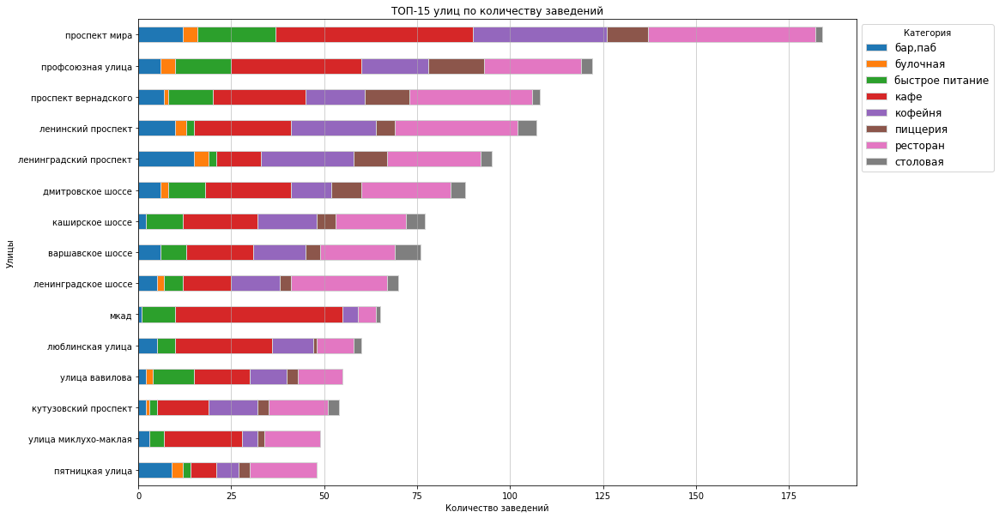

In [54]:
# Фильтрация исходного DataFrame по ТОП-15 улицам
filtered_df = df[df['street'].isin(top15_streets['street'])]

# Сгруппируем данные по районам и категориям
str_cat = filtered_df.groupby(['street', 'category']).size().unstack().fillna(0)

# Добавляем колонку 'total' для сортировки
str_cat['total'] = str_cat.sum(axis=1)
str_cat = str_cat.sort_values(by='total', ascending=True).drop('total', axis=1)

# Создаем график
fig, ax = plt.subplots(figsize=(15, 10))
str_cat.plot(kind='barh', stacked=True, edgecolor='lightgrey', ax=ax)

# Настраиваем оси и заголовок
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Улицы')
ax.set_title('ТОП-15 улиц по количеству заведений')

# Размещаем легенду справа
ax.legend(title='Категория', fontsize='large', loc='upper left', bbox_to_anchor=(1, 1))

# Добавляем сетку
ax.grid(axis='x', linestyle='-', alpha=0.7)

# Отображаем график
plt.show()

 - В топе проспект Мира, это один из проспектов проходящий через центр Москвы и популярные достопремичательности. Не удивительно, что на нем сконцентрировано большое число разных заведений.
 - На втором месте - Профсоюзная улица Москвы. Она располагается в Юго-Западном административном округе города. Она находится на территории таких московских районов, как Академический, Коньково, Черемушки, Теплый Стан, Обручевский и Ясенево.
 - В топ-5 улиц поали улицы и проспекты располженные в центре города. По данным полученным выше, в этом округе наибольшая концентрация заведений.

#### Улицы на которых только один объект общепита.

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [55]:
# Фильтруем улицы, на которых только один объект, и получаем итоговый DataFrame
single_item_streets = df[
    df["street"].isin(
        df["street"].value_counts()[df["street"].value_counts() == 1].index
    )
]

# Выводим результат
print("Число улиц с одним объектом общественного питания =", len(single_item_streets))
single_item_streets["street"].head(10)

Число улиц с одним объектом общественного питания = 452


15                 улица бусиновская горка
21                       прибрежный проезд
25                       парк левобережный
58                         угличская улица
60       ландшафтный заказник лианозовский
64     лианозовский парк культуры и отдыха
71                      новгородская улица
73                          парк алтуфьево
97                       бибиревская улица
103                    лианозовский проезд
Name: street, dtype: object

В датасэте 453 улицы только с одним заведением общественного питания. Только по названиям сложносделать выводы, посмотрим на расположение этих улиц.

In [56]:
# Фильтрация исходного DataFrame по ТОП-15 улицам
filtered_df = df[df['street'].isin(single_item_streets['street'])]

# создаём карту Москвы
m_с = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_с)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке отфильтрованного датафрейма
filtered_df.apply(create_clusters, axis=1)

# выводим карту
m_с

Интересное наблюдение - около 33% улиц только с одним заведением находятся в ЦАО, чем дальше от центра, тем их меньше. Стоит обратить на них внимание, при выборе места для новой кофейни.

Можно провести доплнительное исследование на предмет:
   - **Уникальность расположения:** Объекты общепита, находящиеся на улицах с единственным заведением, могут иметь меньше конкуренции. Это может быть преимуществом в плане привлечения клиентов, так как жители и проходящие мимо будут обращать внимание на единственное заведение, расположенное на данной улице.
   - **Влияние окружающей среды:** Расположение также может зависеть от инфраструктуры вокруг: наличие парковок, транспортных узлов, общественного транспорта и т.д. Объекты общепита на таких улицах могут особенно страдать от недостатка проходимости.
   - **Место для развития:** В некоторых случаях такие заведения могут рассматриваться как площадка для уникального бизнес-формата или концепции, что может привлечь внимание и увеличить популярность с течением времени.

Таким образом, этим заведения можно уделить особое внимание, поскольку они могут представлять собой интересные модели бизнеса с уникальными характеристиками. Если заказчика заинтересует такое дополнительное исследование, его можно провести.

#### Хороплет со средним чеком по районам

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [57]:
# Группируем по району и считаем медиану среднего чека
median_bill_by_district = (
    df.groupby("district")["middle_avg_bill"].median().reset_index()
)
median_bill_by_district.columns = ["district", "median_avg_bill"]
median_bill_by_district.sort_values(by='median_avg_bill', ascending=False)

,district,median_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


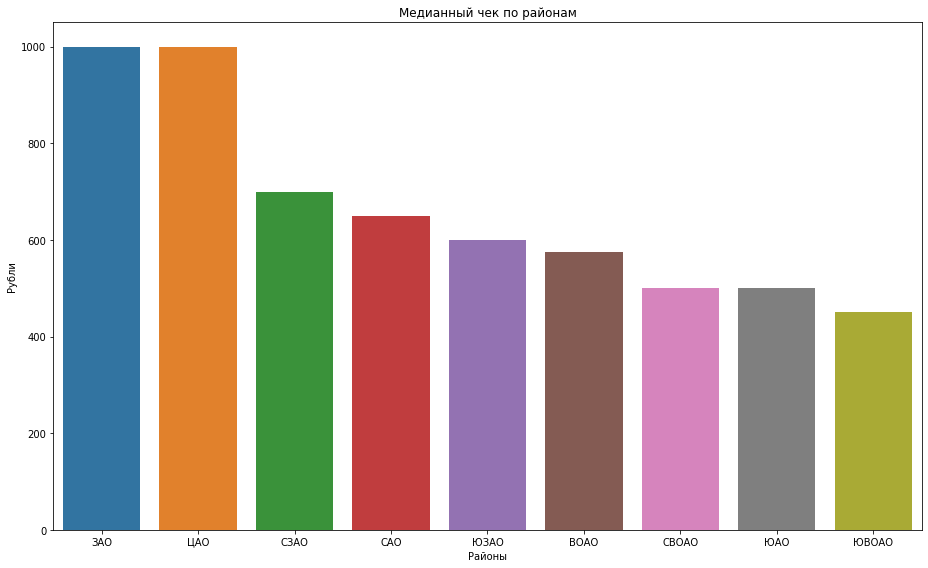

In [58]:
by_district = (
    df.groupby("abr_distr")["middle_avg_bill"].median().reset_index()
)
by_district.columns = ["distr", "median_avg_bill"]
by_district.sort_values(by='median_avg_bill', ascending=False)

#Построение столбчатой диаграммы с использованием seaborn
plt.figure(figsize=(13, 8))
sns.barplot(x='distr', y='median_avg_bill', data=by_district.sort_values(by='median_avg_bill', ascending=False))
plt.title('Медианный чек по районам')
plt.xlabel('Районы')
plt.ylabel('Рубли')
plt.tight_layout()
plt.show()

In [59]:
# Группируем по району и считаем медиану среднего чека
median_bill_by_district = (
    df.groupby("district")["middle_avg_bill"].median().reset_index()
)
median_bill_by_district.columns = ["district", "median_avg_bill"]

# Создаем карту
m_bill = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=median_bill_by_district,
    columns=['district', 'median_avg_bill'],
    key_on='feature.properties.name',
    fill_color='YlGn',  # Цветовая палитра 'RdPu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Медианный чек по районам',
).add_to(m_bill)

# Добавляем метки для каждого района
for _, row in median_bill_by_district.iterrows():
    district_name = row['district']
    # Укажите координаты для вашего района (например, вы можете использовать центры)
    # Предположим, вы храните координаты в словаре
    

# Отображаем карту
m_bill

 - Первые два места по среднему чеку поделили Центральный и Западный административнй округ. Около 1000 рублей. В центре города сконцентрированы все достопримечательности, Западный округ известен своей элитной недвижимостью. 
 - Районы с самым низким средним чеком: Северо-восточный, Южный и Юго-восточный административные округа. Медианный чек примерно одинаков в диапазоне 450-500 руб.
 - В остальных районах средний чек составляет 575-700 рублей.

#### Шаг 3. Выводы.

**Категории.** В данных встречаются следующие категории заведений общественного питания: `кафе`, `ресторан`, `кофейня`, `пиццерия`, `бар,паб`, `быстрое питание`, `булочная`, `столовая`.

**Посадочные места.** На первом месте по количеству посадочных мест: `бар/паб` со средним числом около 120, второе место у `ресторан` - 118 мест, на третьем месте `кофейни` - 108 мест. Из-за наличия открытых пространсв и крупных торговых центров с ресторанными двориками, количество мест в заведении сильно исказилось. Есть кофейни с количеством мест более 1000.

**Соотношение сетевых и несетевых заведений** 38% к 62%. Чаще всего к сетевым относятся: `кафе`, `ресторан` и `кофейня`. Остальные виды точек представлены здесь в значительно меньших или в незначительных объемах.

**ТОП сетевых заведений** Явный лидер и с большим отрывом сеть кофеин - `Шоколадница`. Около 119 точек в регионе. Остальные 5 мест,  с количеством точек от 76 до 65, следующие: `Домино'с Пицца`, `Додо Пицца`,
`One Price Coffee`, `Яндекс Лавка`, `Cofix`. В выборке встречаются довольно популярные заведения. Например `Шоколадница` - сеть кофеин, есть практически во всех крупных торговых центрах. `Домино'с Пицца` и `Додо Пицца` - популярные пицерии.

**Распределение по категориям и округам.** В каждом округе преобладают кафе, рестораны и кофейни. Наименее популярны булочные. Из всех районов выделяется Центральный АО, с наибольшим числом заведений. В этом округе преобладают рестораны, бары, кафе и кофейни.

Больше всего заведений сконцентрированно в Центральном АО, около 2,2 тыс заведений. В остальных административных округам количество организаций не превышает 1 тыс. Меньше всего заведений в Северно-Западном округе и это значение в 1,5-2 раза ниже характерного для всех других районов.



**Анализ среднего рейтинга заведений**
- Наивысший средний рейтинг у `бар,паб` около 4,4. Бары/пабы всчтречаются на порядок реже, чем кафе.
- У заведений: `ресторан`, `кофейня`, `пицерия`, `булочная`, `столовая`  средний рейтинг от 4.2 до 4.4.
- Самый низкий средний рейтинг и наибольший разброс у заведений: `кафе` и `быстрое питание`. Это и не удивительно. Кафе самая популярная категория заведений, поэтому и разборс оценок здесь довольно высокий. 

Самые высокие оценки - в центре, ниже всего на северо и юго-востоке.

**Анализ среднего чека.** Первые два места по среднему чеку поделили Центральный и Западный административнй округ. Около 1000 рублей. В центре города сконцентрированы все достопримечательности, Западный округ известен своей элитной недвижимостью.
 - Районы с самым низким средним чеком: Северо-восточный, Южный и Юго-восточный административные округа. Медианный чек примерно одинаков в диапазоне 450-500 руб.
 - В остальных районах средний чек составляет 575-700 рублей.

### Шаг 4. Детализируем исследование: открытие кофейни.

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
    
  Ответим на следующие вопросы:
  - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
  - Есть ли круглосуточные кофейни?
  - Какие у кофеен рейтинги? Как они распределяются по районам?
  - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

#### Количество кофеен в датасэте.

In [60]:
# отфильтруем таблицу по категории - кофейня
df_coffee = df.query('category == "кофейня"')
print('Всего кофеен: ', df_coffee['name'].count())

Всего кофеен:  1413


Проанализируем полученный срез, посмотрим на общую информацию о датасэте и количество пропусков.

In [61]:
df_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              749 non-null    float64
 14  street             1413 non-null   object 
 15  is_24_7            1413 non-null   bool   
 16  abr_distr          1413 

Названия столбцов написанны корректно, типы данных соответствуют значениям в колонках.

In [62]:
# Проверка на наличие пропусков в столбцах
df_coffee.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                  15
lat                     0
lng                     0
rating                  0
price                 937
avg_bill              692
middle_avg_bill      1213
middle_coffee_cup     892
chain                   0
seats                 664
street                  0
is_24_7                 0
abr_distr               0
dtype: int64

Всего в датасете представлено 1413 кофеен. По основным категориям данных: наименование, адрес, район, улица пропусков нет. Но смущает наличие пропусков по средней стоимости за чашку капучино, данные заполнены только на 63%.

#### Аномалии в распределение цен за "чашку капучино".

 Построим гистограмму. В дальнейшем исследовании нам потребуются эти данные посмотрим есть ли аномалии в этой колонке.

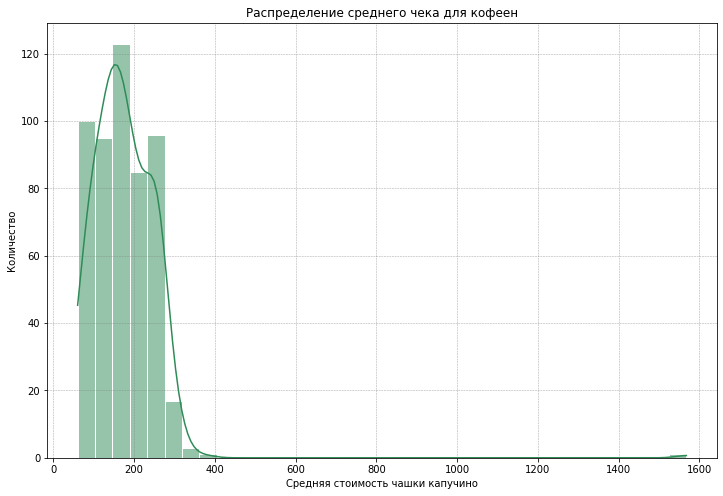

In [63]:
# строим гистограмму
plt.figure(figsize=(12, 8))
sns.histplot(df_coffee['middle_coffee_cup'], bins=35, kde=True, color='seagreen', edgecolor='white')  # Добавляем edgecolor
plt.title('Распределение среднего чека для кофеен')
plt.xlabel('Средняя стоимость чашки капучино')
plt.ylabel('Количество')
# Добавление сетки
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, alpha=0.7)  # Настройка сетки
plt.show()

Чаще всего стоимость чашки кофе находится в диапазоне от 60 руб. до 300 руб. Но встречаются и аномально дорогие кофейни со средним чеком около 1500 руб. Посмотрим их подробней.

In [64]:
# аномалии для колонки 'middle_coffee_cup'
abnormal_bill = df_coffee.query('middle_coffee_cup>1000')
abnormal_bill 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,abr_distr
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,большая семёновская улица,False,ВОАО


Такая кофейня одна и довольно популярная, Шоколадница. похоже на опечатку в столбце avg_bill. Вот корректные значения: Цена чашки капучино:230–297 ₽. прежде чем произвести замену, посмотрим средний чек в 7 других точках этой сети.

In [65]:
# Шоколадница для колонки 'middle_coffee_cup'
choco = df_coffee.query('name == "шоколадница" and avg_bill.notna()')
choco.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,abr_distr
151,шоколадница,кофейня,"москва, дмитровское шоссе, 163ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,дмитровское шоссе,False,СВОАО
240,шоколадница,кофейня,"москва, широкая улица, 13а",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75.0,широкая улица,False,СВОАО
343,шоколадница,кофейня,"москва, фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,100.0,фестивальная улица,False,САО
360,шоколадница,кофейня,"москва, сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.846066,37.438897,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,130.0,сходненская улица,False,СЗАО
455,шоколадница,кофейня,"москва, улица адмирала макарова, 6, стр. 13",Северный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00–23:00",55.835660,37.490497,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,80.0,улица адмирала макарова,False,САО


Да наши предположения подтвердились средняя стоимость чашки кофе не превышает 300 руб, Заменим в исходном датафрэйме значения в столбцах avg_bill и middle_coffee_cup.

In [66]:
# Условие для фильтрации
condition = df['middle_coffee_cup'] > 1000

# Замена значений в соответствующих строках
df.loc[condition, 'avg_bill'] = 'Цена чашки капучино:230–297 ₽'
df.loc[condition, 'middle_coffee_cup'] = 264

Обновим датасэт df_coffee, и посмотрим на общею информацию по нему.

In [67]:
# обновим срез df_coffee
df_coffee = df.query('category == "кофейня"')
df_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              749 non-null    float64
 14  street             1413 non-null   object 
 15  is_24_7            1413 non-null   bool   
 16  abr_distr          1413 

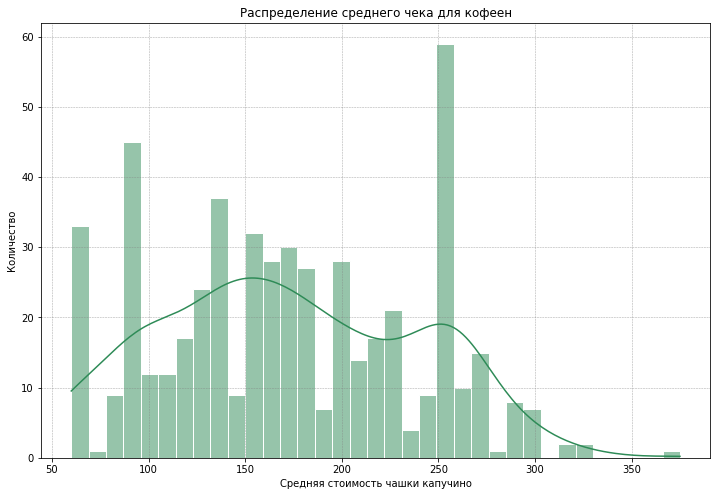

In [68]:
# строим гистограмму
plt.figure(figsize=(12, 8))
sns.histplot(df_coffee['middle_coffee_cup'], bins=35, kde=True, color='seagreen', edgecolor='white')  # Добавляем edgecolor
plt.title('Распределение среднего чека для кофеен')
plt.xlabel('Средняя стоимость чашки капучино')
plt.ylabel('Количество')
# Добавление сетки
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, alpha=0.7)  # Настройка сетки
plt.show()

Замена проведена корректно.

#### Распределение кофеен по районам города.

Посмотрим как они распределены по районам города.

In [69]:
# Группируем по району и считаем количество кофеен в каждом
coffee_district_counts = df_coffee['district'].value_counts().reset_index()
coffee_district_counts.columns = ['district', 'count']  # Переименуем колонки

# Создаем карту
m_cof = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=coffee_district_counts,
    columns=['district', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Количество кофеен по районам',
).add_to(m_cof)
m_cof

**Анализ распределения:**
После визуализации карты можно проанализировать распределение коффеев:

 - Район с самой высокой концентрацией - Центральный. Участок с наиболее темным цветом на карте.
 - самые светлые участки карты - это районы с наименьшим количеством кофеен. К эти округам относятся: Юго-Западный, Юго-Восточный и Северо-Западный АО.
 
**Дополнительная визуализация:**
Построим столбчатую диаграмму для отображения распределения количества кофеен по всем районам:

In [70]:
# Группируем по району и считаем количество кофеен в каждом
distr_count = df_coffee['abr_distr'].value_counts().reset_index()
distr_count.columns = ['abr_distr', 'count']  # Переименуем колонки
distr_count['perc']=round(distr_count['count']/distr_count['count'].sum()*100,1)


# Создание столбчатой диаграммы
fig = px.bar(distr_count.sort_values(by='perc', ascending=False), x='abr_distr', y='count', 
             text='perc',  # Отображаем проценты на столбцах
             labels={'abr_distr': 'Район', 'count': 'Количество заведений'})

# Форматирование текста
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')

# оформляем график
fig.update_layout(title='Доля кофеен от общего числа, по районам города',
                   xaxis_title='Район',
                   yaxis_title='Доля')

# Отображение графика
fig.show()

В центральном районе сконцентрировано практически треть всех кофеен Москвы. Далее идут Северный, Северо-Восточный и Западный административный округ. Меньше всего кофеен в Северо-Западном АО.

#### Круглосуточные кофейни.

Посмотрим популярные режимы работы кофеен. Логично предположить, что кофейни чаще работают в утренние и дневные часы. Посмотрим на распределение в реальности.

In [71]:
# Фильтруем только кофейни
df_coffee = df[df['category'].str.contains('кофейня', na=False)]

# Посмотрим какие режимы работы встречаются чаще всего
coffee_working_hours = df_coffee['hours'].value_counts().reset_index()
coffee_working_hours.columns = ['hours', 'count']  # Переименовываем колонки
display(coffee_working_hours.head(10), coffee_working_hours['count'].sum())

,hours,count
0,"ежедневно, 10:00–22:00",140
1,"ежедневно, 08:00–22:00",60
2,"ежедневно, круглосуточно",59
3,"ежедневно, 09:00–22:00",57
4,пн-пт 08:00–19:00,46
5,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",46
6,"ежедневно, 09:00–21:00",43
7,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",42
8,"ежедневно, 08:00–21:00",36
9,пн-пт 08:00–18:30,34


1398

Самый популярный режим работы кофейни `ежедневно, 10:00–22:00`. Но довольно часто встречаются и круглосуточные заведения `ежедневно, круглосуточно` - 59 кофеен. Посмотрим как они распологаются на карте.
- 4,2% точек работают круглосуточно.

In [72]:
# отфильтруем только кофейни работающие `ежедневно, круглосуточно`
round_the_clock = df_coffee.query('is_24_7 == True')

# Создаем карту
m_rtc = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# Создаем кластер маркеров
marker_cluster = MarkerCluster().add_to(m_rtc)

def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/?size=100&id=26401&format=png&color=000000'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
round_the_clock.apply(create_clusters, axis=1)

# Отображаем карту
m_rtc

Как и следовало преположить, наибольшее число круглосуточных коффеен в центре города. Чем дальше от центра, тем таких заведений меньше.
Если заказчик решит открыть круглосуточную кофейню, то стоит обратить внимание на центральный район.

#### Проанализируем рейтинги кофеен и как они распределяются по районам

Какие у кофеен рейтинги? Как они распределяются по районам?

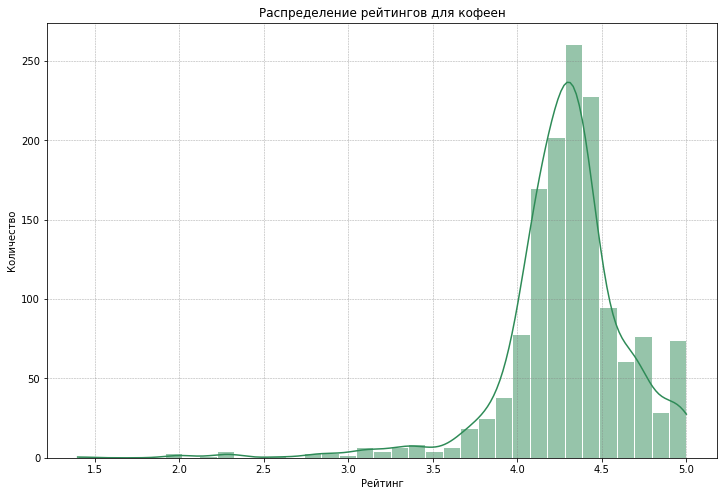

In [73]:
# строим гистограмму
plt.figure(figsize=(12, 8))
sns.histplot(df_coffee['rating'], bins=35, kde=True, color='seagreen', edgecolor='white')  # Добавляем edgecolor
plt.title('Распределение рейтингов для кофеен')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
# Добавление сетки
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, alpha=0.7)  # Настройка сетки
plt.show()

Чаще всего кофейни имеют достаточно высокий рейтинг в диапазоне 4,1-4,6 баллов. Низкие рейтинги встречаются довольно редко. Посмотрим на распределение рейтингов по районам.

In [74]:
# посчитаем средние рейтинги по районам
coffee_rating_df = df_coffee.groupby('district', as_index=False)['rating'].agg('mean')

#строим карту
m_cr = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=coffee_rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_cr)
display(coffee_rating_df.sort_values(by='rating', ascending=False))
m_cr

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


 - Самые высокие средние рейтинги в Центральном, Северо_Западном и Северном округе. Можно предположить, что в этих районах более лояльная целевая аудитория и заведения высокого качества.
 - Районы с самым низким рейтингом кофеен: Западный и Северовосточный округ. Стоит серьезно взвесить все "за и против", прежде чем открывать здесь новую кофейню.

#### Средняя стоимость "чашки капучино" по районам.

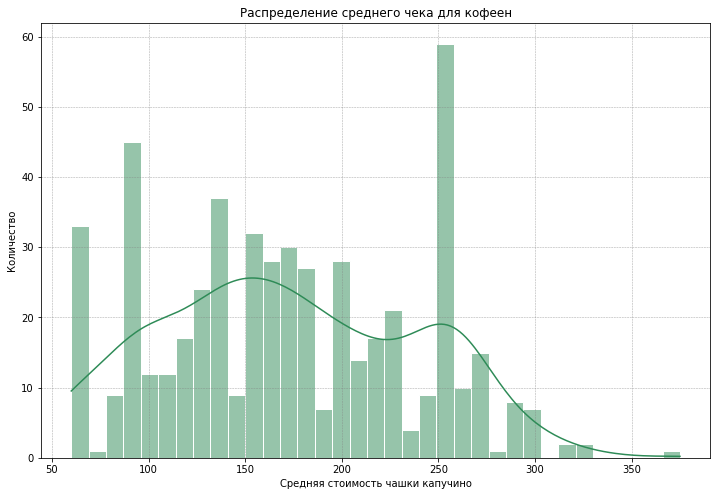

In [75]:
# строим гистограмму
plt.figure(figsize=(12, 8))
sns.histplot(df_coffee['middle_coffee_cup'], bins=35, kde=True, color='seagreen', edgecolor='white')  # Добавляем edgecolor
plt.title('Распределение среднего чека для кофеен')
plt.xlabel('Средняя стоимость чашки капучино')
plt.ylabel('Количество')
# Добавление сетки
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, alpha=0.7)  # Настройка сетки
plt.show()

Еще раз посмотрим на гистограмму распределения частот среднего чека, за чашку капучино.
 Что можно сказать по этому графику? Цена за чашку от 70 до 350 рублей. Есть несколько пиков: 70,90 и 250 рублей.

Для оценки среднего чека корректней использовать медиану.
Построим хороплет по районам Москвы.

In [76]:
# посчитаем средний чек чашки капучино по районам
df_coffee_cup = df_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')

#строим карту
m_сcu = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=df_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.properties.name',
    fill_color='YlGn', # Цветовая палитра 'RdPu'
    fill_opacity=0.8,
    legend_name='Медианная стоимость кружки кофе по районам',
).add_to(m_сcu)

display(df_coffee_cup.sort_values(by='middle_coffee_cup',ascending=False), m_сcu)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Какие выводы можно сделать по этой карте:
 - Самая высокий средний чек в Западном, Юго-Западном и Центральном районах, и составляет около: 189-190 руб. за кружку.
 - Самая низкая стоимость в Восточном округе и составляет около 135 руб за кружку.

#### Вывод:

In [77]:
# Объединяем DataFrame в итоговую таблицу
final_merged_df = pd.merge(
    pd.merge(coffee_district_counts, coffee_rating_df, on='district', how='outer'), 
    df_coffee_cup, 
    on='district', 
    how='outer'
)

# Замена названий районов в итоговом DataFrame
final_merged_df['district'] = final_merged_df['district'].replace(abbreviations)

# Вывод результата
final_merged_df

,district,count,rating,middle_coffee_cup
0,ЦАО,428,4.336449,190.0
1,САО,193,4.291710,159.0
2,СВОАО,159,4.216981,162.5
3,ЗАО,150,4.195333,189.0
4,ЮАО,131,4.232824,150.0
5,ВОАО,105,4.282857,135.0
6,ЮЗАО,96,4.283333,198.0
7,ЮВОАО,89,4.225843,147.5
8,СЗАО,62,4.325806,165.0


##### Попробуем определеть **самые перспективные районы** для открытия новой кофейни на основе полученных данных.

 **Центральный административный округ.**  Практически треть всех кофеен Москвы находятся именно здесь, около 430 заведений. Высокая конкуренция, но и большой спрос. Многие из них работают круглосуточно. Самые высокие средние рейтинги по городу - 4,33. Стоимость чашки капучино выше среднего - 190 руб. за чашку.

**Юго-Западный АО** Кофеен мало, около 96 точек. Следовательно низкая конкуренция. Рейтинги средние - 4,28. При этом стоимость чашки капучино довольно высокая - 198 руб. за чашку.

**Северный АО** Район с высоким количеством кофеен около 193 точек. Высокая конкуренция и спрос. Высокие средние рейтинги - 4,29. Стоимость чашки капучино средняя - 159 руб. за чашку.

**Северо-Западный АО** Район с наименьшим количеством кофеен около 62 точек. Следовательно низкая конкуренция, возможно и низкий спрос. Высокие средние рейтинги - 4,33. Стоимость чашки капучино средняя - 165 руб. за чашку.

##### Остальные районы Москвы, так же достойны внимания, но **менее перспективны:**

**Северо-Восточный АО** Район с высоким количеством кофеен около 159 точек. Низкие средние рейтинги - 4,22. Средняя стоимость чашки капучино средняя - 162 руб. за чашку.

**Восточный АО** Количество кофеен ниже среднего - 105 точек. Высокие средние рейтинги - 4,28. Стоимость чашки капучино ниже среднего - 135 руб. за чашку.

**Юго-Восточный АО** Точек мало, всего 89. Низкие средние рейтинги - 4,23. Стоимость чашки капучино ниже среднего - 147,5 руб. за чашку.

**Южный АО** Среднее количеством кофеен, около 131 точка. Низкие средние рейтинги - 4,23. Стоимость чашки капучино ниже среднего - 150 руб. за чашку.

**Западный АО** Среднее количеством кофеен, около 150 точек. При этом самые низкие средние рейтинги - 4,19. Стоимость чашки капучино выше среднего - 189 руб. за чашку.

##### Расположение и время работы

 - 4,2% точек работают круглосуточно, самый популярный режим работы “ежедневно, 10:00–22:00”
 - Удачное расположение рядом со станциями метро, достопримечательностями и бизнес-центрами.
 - Интересное наблюдение - около 33% улиц только с одним заведением находятся в ЦАО, чем дальше от центра, тем их меньше. Стоит обратить на них внимание, при выборе места для новой кофейни.
 - В топе проспект Мира, это один из проспектов проходящий через центр Москвы и известные достопремичательности. Не удивительно, что на нем сконцентрировано большое число заведений.

### Итоговые выводы.

Чаще встречаются кафе - более 2,4 тыс. точек. Ресторан - около 2 тыс. Кофейни - примерно 1,4 тыс. Следующие три места разделили между собой: бар/паб, пиццерия и быстрое питание от 765 до 603 заведений. На последних двух местах столовая и булочная 315 и 256 мест.

Несетевых заведений значительно больше (62%), чем сетевых (38%). Среди сетевых заведений в топе:  `булочная`, `пицерия` и `кофейня`. Остальные виды точек представлены здесь в значительно меньших объемах.

Самые популярные **сетевые заведения**, это:
 - Явный лидер и с большим отрывом сеть кофеин - Шоколадница. Около 119 точек в регионе.
 - Остальные 5 мест, с количеством точек от 65 до 76, следующие: Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix.
 - В выборке встречаются довольно популярные заведения. Например Шоколадница - сеть кофеин, есть практически во всех крупных торговых центрах. Домино'с Пицца и Додо Пицца - популярные пицерии. В топе - кофейни, 6 сетевых заведений с наибольшим количеством точек. 3 кафе и 3 ресторана.

**По количеству заведений** из всех районов выделяется Центральный АО, с наибольшим числом точек. В этом округе преобладают рестораны, бары, кафе и кофейни. В остальных административных округам количество организаций не превышает 1 тыс. Меньше всего заведений в Северно-Западном округе и это значение в 1,5-2 раза ниже характерного для всех других районов.

Наивысший **средний рейтинг** у бар/паб около 4,4. Рестораны, кофейни, пицерии, булочные и столовые имеют средний рейтинги от 4.2 до 4.3. Самые высокие оценки - в центре, ниже всего на северо и юго-восто

**Популярные улицы в регионе.** В топе проспект Мира, это один из проспектов проходящий через центр Москвы и известные достопремичательности. Не удивительно, что на нем сконцентрировано большое число разных точек общепита.
На втором месте - Профсоюзная улица. Она располагается в Юго-Западном административном округе города. Она находится на территории таких московских районов, как Академический, Коньково, Черемушки, Теплый Стан, Обручевский и Ясенево.
В топ-5 улиц попали улицы и проспекты располженные в центре города. По данным полученным выше, в этом округе наибольшая концентрация заведений.

В датасэте 453 **улицы с одним заведением общественного питания**. Только по названиям улиц, сложно сделать какие либо выводы. Можно провести доплнительное исследование, при необходимости. Около 33% таких улиц расположены в центральном районе.

Первые два места по **среднему чеку** поделили Центральный и Западный административнй округ. Около 1000 рублей. В центре города сконцентрированы все достопримечательности, Западный округ известен своей элитной недвижимостью.
Районы с самым низким средним чеком: Северо-восточный, Южный и Юго-восточный административные округа. Медианный чек примерно одинаков в диапазоне 450-500 руб. В остальных районах средний чек составляет 575-700 рублей.

**Презентация:** https://disk.yandex.ru/i/18ZrQv3lv78PRg